In [1]:
# Bibliotecas comuns
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
import sklearn

# Librosa
import librosa
import librosa.display
import IPython.display as ipd
import warnings
warnings.filterwarnings('ignore')

In [2]:
import os
general_path = 'GTZAN Data'
print(list(os.listdir(f'{general_path}/genres_original/')))

['jazz', 'pop', 'reggae', 'rock', 'hiphop', 'country', 'blues', 'metal', 'disco', 'classical']


## Explorando dados do áudio

Vamos explorar os dados para ver como eles se parecem, temos duas características para atentar:
- O som (y) sequência de vibrações que variam
- A taxa de amostragem (sr) é o número de amostra de áudios carregados popr segundos

In [3]:
y, sr = librosa.load(f'{general_path}/genres_original/disco/disco.00004.wav')

print('y:', y, '\n')
print('formato de y:', np.shape(y), '\n')
print('Taxa de amostragem (kHz):', sr, '\n')

# Verificando tamanho do áudio
print('Tamanho do áudio:', 661794/22050)

y: [ 0.00262451  0.01730347 -0.01803589 ... -0.14556885 -0.1444397
 -0.03250122] 

formato de y: (661794,) 

Taxa de amostragem (kHz): 22050 

Tamanho do áudio: 30.013333333333332


In [4]:
# Cortar o silêncio antes e depois do áudio começar
audio_file, _ = librosa.effects.trim(y)

# o resultado é um array numpy
print('Arquivo de áudio:', audio_file, '\n')
print('Formato do arquivo:', np.shape(audio_file))

Arquivo de áudio: [ 0.00262451  0.01730347 -0.01803589 ... -0.14556885 -0.1444397
 -0.03250122] 

Formato do arquivo: (661794,)


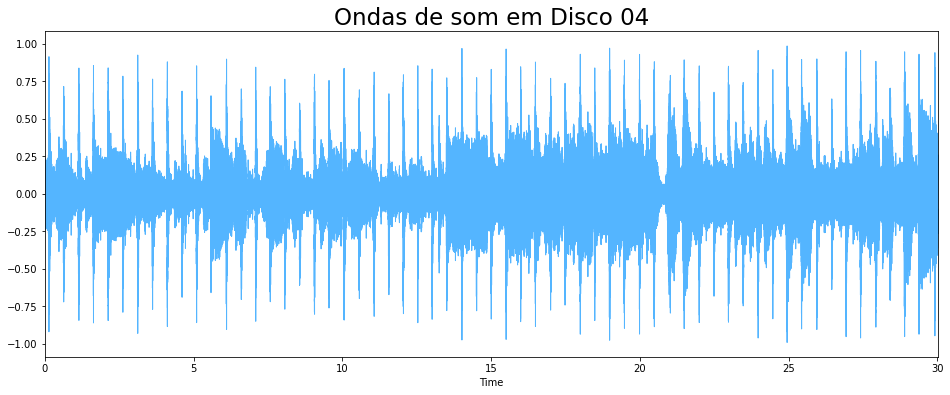

In [5]:
## Representação 2D das ondas de áudio
plt.figure(figsize=(16,6))
librosa.display.waveplot(y = audio_file, sr = sr, color = "#54B5FF")
plt.title("Ondas de som em Disco 04", fontsize = 23)           
plt.savefig("sound waves")

## Transformada de Fourier

- Função que pega o sinal no domínio temporal como entrada e retorna sua decomposição em frequências
- Transforma a frequência em escala logarítmica e a amplitude em Decibel, que é aproximadamente a escala logarítmica da amplitude

In [6]:
# Tamanho padrão da janela
n_fft = 2048
hop_length = 512 # número de quadros de áudio entre as colunas STF e T

plt.figure(figsize=(16,6))

# Short-time Fourier Transform (STFT)
D = np.abs(librosa.stft(audio_file, n_fft = n_fft, hop_length = hop_length))

print('Formato do objeto D:', np.shape(D))

Formato do objeto D: (1025, 1293)


<Figure size 1152x432 with 0 Axes>

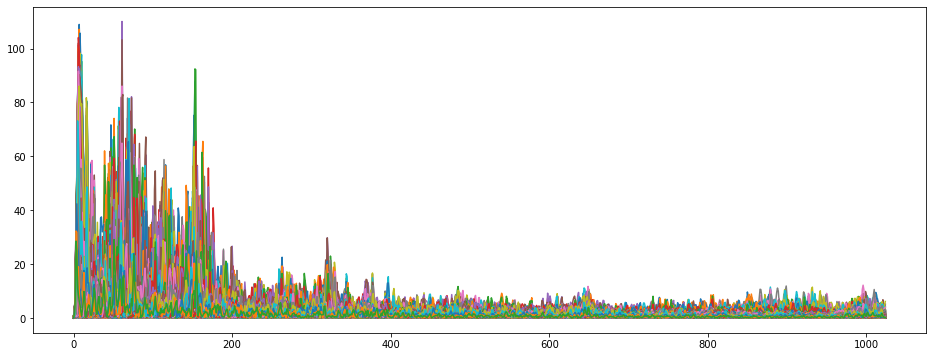

In [7]:
plt.figure(figsize=(16,6))
plt.plot(D);
plt.savefig("fourier transform")

## O Espectograma

- Um espectograma é uma representação visual do espectro de frequências de um sinal que varia com o tempo.

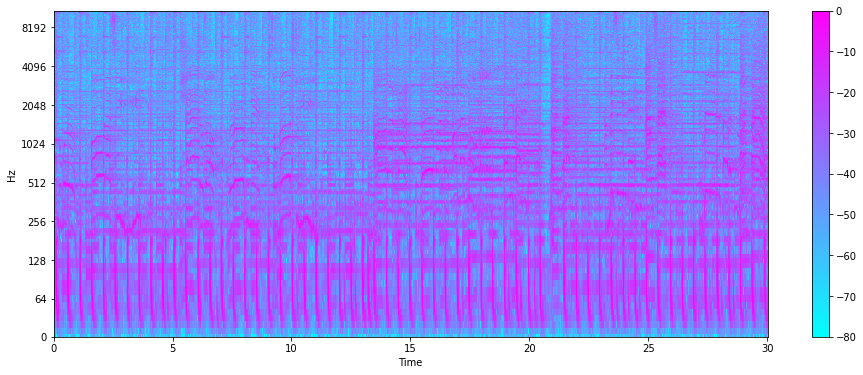

In [8]:
# Converter a amplitude para a escala de Decibéis
DB = librosa.amplitude_to_db(D, ref = np.max)

plt.figure(figsize=(16,6))

# Criar o espectograma
librosa.display.specshow(DB, sr=sr, hop_length=hop_length, x_axis='time', y_axis='log', cmap='cool')
plt.colorbar()
plt.savefig("espectogram")

## Espectograma Mel

- A escala de Mel é resultado de uma transformação não linear na frequência. O espectograma Mel é um espectograma normal com uma escala Mel no eixo y.

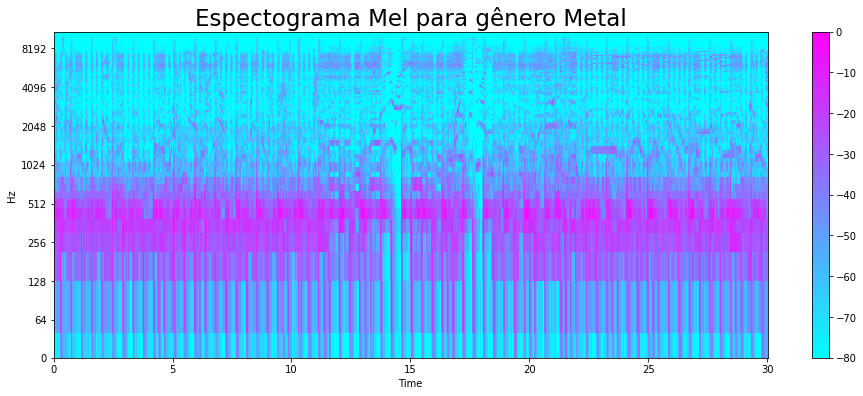

In [9]:
y, sr = librosa.load(f'{general_path}/genres_original/metal/metal.00025.wav')
y, _ = librosa.effects.trim(y)

plt.figure(figsize=(16,6))

S = librosa.feature.melspectrogram(y, sr=sr)
S_DB = librosa.amplitude_to_db(S, ref=np.max)

librosa.display.specshow(S_DB, sr=sr, hop_length=hop_length, x_axis='time', y_axis='log', cmap='cool')
plt.colorbar()
plt.title('Espectograma Mel para gênero Metal', fontsize=23)
plt.savefig("mel espectogram_metal")

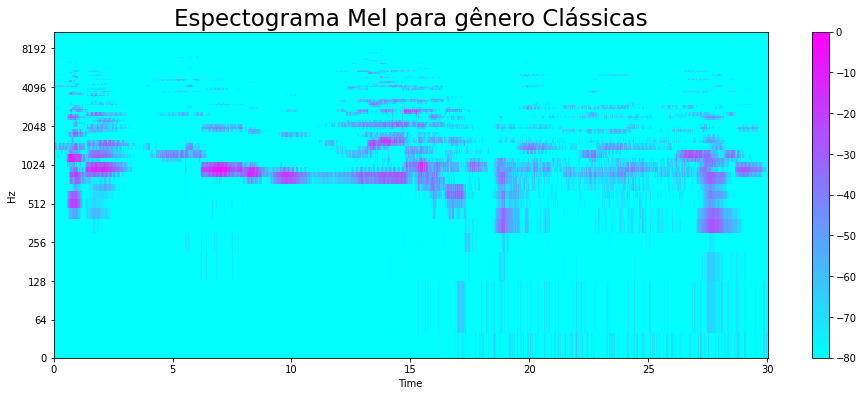

In [10]:
y, sr = librosa.load(f'{general_path}/genres_original/classical/classical.00036.wav')
y, _ = librosa.effects.trim(y)

plt.figure(figsize=(16,6))

S = librosa.feature.melspectrogram(y, sr=sr)
S_DB = librosa.amplitude_to_db(S, ref=np.max)
librosa.display.specshow(S_DB, sr=sr, hop_length=hop_length, x_axis = 'time', y_axis = 'log',
                        cmap = 'cool');
plt.colorbar();
plt.title("Espectograma Mel para gênero Clássicas", fontsize = 23);
plt.savefig("mel spectogram classical")

## Característica de áudios

#### Taxa de Travessia Zero

- Em sinais, a taxa que o sinal muda de positivo para negativo ou vice-versa

In [11]:
# Total de cruzamentos zero em um som
zero_crossings = librosa.zero_crossings(audio_file, pad=False)
print(sum(zero_crossings))

112005


#### Harmônicas e Perceituais

- As harmônicas são características que os anos humanos não conseguem distinguir (representa a cor do som).
- A onda de choque de perceptual representa o ritmo sonoro e a emoção.

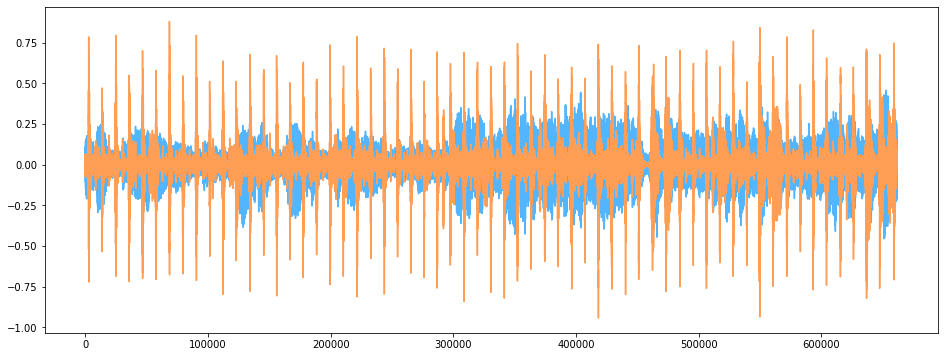

In [12]:
y_harm, y_perc = librosa.effects.hpss(audio_file)

plt.figure(figsize=(16,6))
plt.plot(y_harm, color='#54B5FF')
plt.plot(y_perc, color='#FF9E54')
plt.savefig("harm and percetual")

#### Tempo BPM

In [13]:
tempo, _ = librosa.beat.beat_track(y, sr=sr)
tempo

107.666015625

#### Centroide espectral

- Indica o 'centro de massa' para um som e é calculado com base na média geométrica das frequências

In [14]:
# Calcula o centro espectral
spectral_centroids = librosa.feature.spectral_centroid(audio_file, sr=sr)[0]

# Formato como um vetor
print('Centroides:', spectral_centroids, '\n')
print('Formato dos Centroides Espectrais:', spectral_centroids.shape, '\n')

# Computando a variável temporal para visualização
frames = range(len(spectral_centroids))

# Converte contagem de frames em segundos
t = librosa.frames_to_time(frames)

print('frames:', frames, '\n')
print('t:', t)

# Normalizando os dados
def normalize(x, axis=0):
    return sklearn.preprocessing.minmax_scale(x, axis=axis)

Centroides: [2810.30660397 2874.57677477 2967.48424963 ... 3038.02876297 2892.61804585
 2874.8833304 ] 

Formato dos Centroides Espectrais: (1293,) 

frames: range(0, 1293) 

t: [0.00000000e+00 2.32199546e-02 4.64399093e-02 ... 2.99537415e+01
 2.99769615e+01 3.00001814e+01]


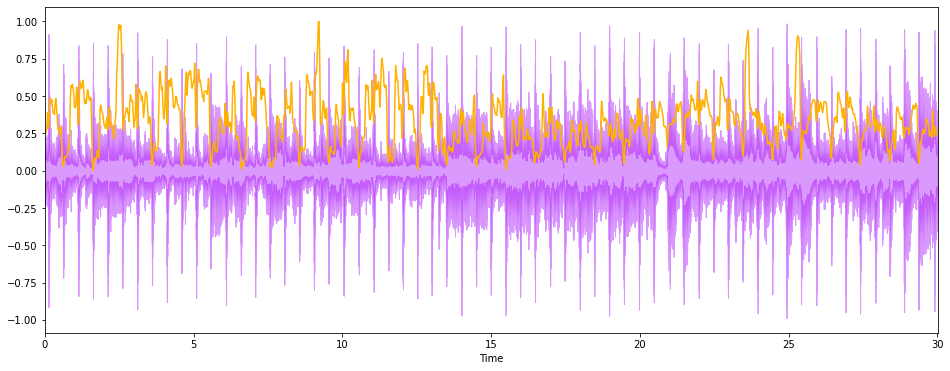

In [15]:
# Plotando o centroide espectral ao longo da onda
plt.figure(figsize=(16,6))
librosa.display.waveplot(audio_file, sr=sr, alpha=0.4, color = '#A300F9');
plt.plot(t, normalize(spectral_centroids), color='#FFB100');
plt.savefig("normalized spec centroid")

#### Rolamento espectral

- É uma medida da forma do sinal digital. Ele representa a frequência abaixo da porcentagem especificada do total de energia espectral.

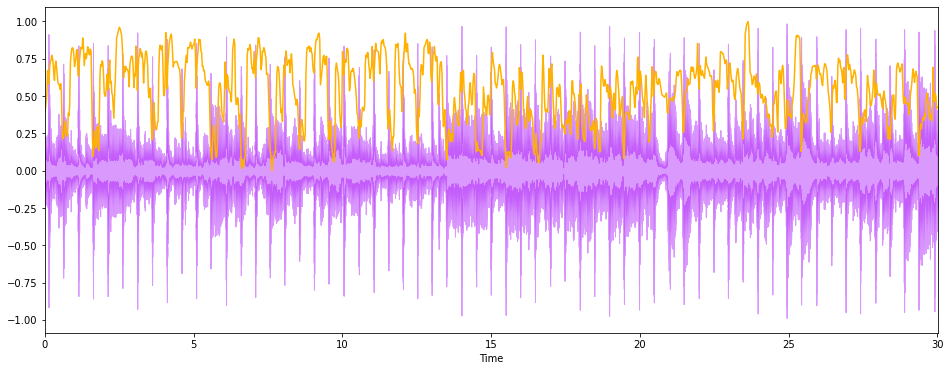

In [16]:
# Vetor rolamento espectral
spectral_rolloff = librosa.feature.spectral_rolloff(audio_file, sr=sr)[0]

# Plot
plt.figure(figsize=(16,6))
librosa.display.waveplot(audio_file, sr=sr, alpha=0.4, color="#A300F9")
plt.plot(t, normalize(spectral_rolloff), color="#FFB100")

#### Coeficientes cepstrais Mel-Frequency

- Os coeficientes cepstrais Mel-Frequency de um sinal são características que descrevem concisamente a forma genérica de um envelope espectral. Ele modela as características da voz humana

Formato MFCCS: (20, 1293)


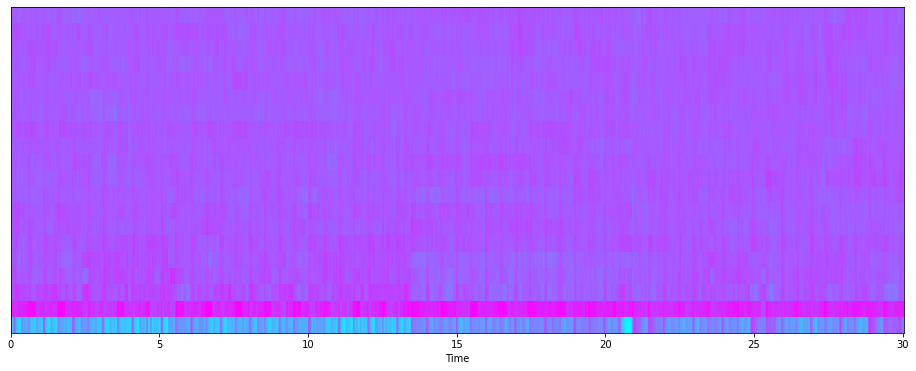

In [17]:
mfccs = librosa.feature.mfcc(audio_file, sr=sr)
print('Formato MFCCS:', mfccs.shape)

# MFCCs
plt.figure(figsize=(16,6))
librosa.display.specshow(mfccs, sr=sr, x_axis='time', cmap='cool')

Os dados precisam ser normalizados.

Média: 1.1801075e-09 

Variância: 0.99999994


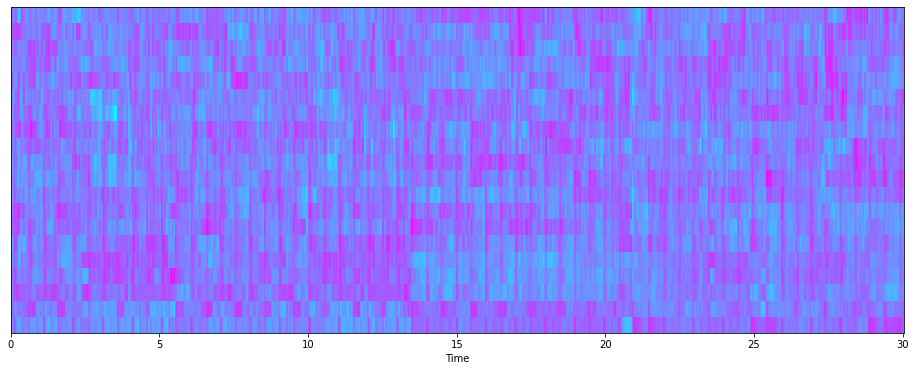

In [18]:
mfccs = sklearn.preprocessing.scale(mfccs, axis=1)
print('Média:', mfccs.mean(), '\n')
print('Variância:', mfccs.var())

plt.figure(figsize=(16,6))
librosa.display.specshow(mfccs, sr=sr, x_axis='time', cmap='cool')
plt.savefig("coef cepstral mel-freq normalized")

#### Frequência Chroma

A característica cromática é interessante para representação  de áudios que separa todo o espectro em 12 partes, representando os 12 semitons da oitava musical

Formato do chromagram: (12, 133)


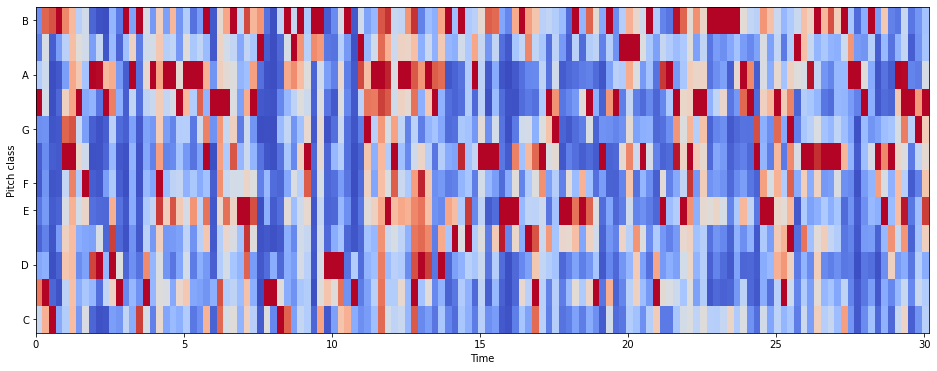

In [19]:
# Dependendo da granularidade, aumenta ou diminui o hop_length
hop_length = 5000

# Plotando o chromagrama
chromagram = librosa.feature.chroma_stft(audio_file, sr=sr,
                                         hop_length=hop_length)
print('Formato do chromagram:', chromagram.shape)

plt.figure(figsize=(16,6))
librosa.display.specshow(chromagram, x_axis='time', y_axis='chroma',
                        hop_length=hop_length, cmap='coolwarm')
plt.savefig("chroma freq")

#### EDA

A análise exploratória será feita na `features_30_sec.csv`. O arquivo contém a média e variância para cada arquivo de áudio. A tabela possui 1000 linhas e 60 características.

In [20]:
data = pd.read_csv(f'{general_path}/features_30_sec.csv')
data.head()

,filename,length,chroma_stft_mean,chroma_stft_var,rms_mean,rms_var,spectral_centroid_mean,spectral_centroid_var,spectral_bandwidth_mean,spectral_bandwidth_var,...,mfcc16_var,mfcc17_mean,mfcc17_var,mfcc18_mean,mfcc18_var,mfcc19_mean,mfcc19_var,mfcc20_mean,mfcc20_var,label
0,blues.00000.wav,661794,0.350088,0.088757,0.130228,0.002827,1784.165850,129774.064525,2002.449060,85882.761315,...,52.420910,-1.690215,36.524071,-0.408979,41.597103,-2.303523,55.062923,1.221291,46.936035,blues
1,blues.00001.wav,661794,0.340914,0.094980,0.095948,0.002373,1530.176679,375850.073649,2039.036516,213843.755497,...,55.356403,-0.731125,60.314529,0.295073,48.120598,-0.283518,51.106190,0.531217,45.786282,blues
2,blues.00002.wav,661794,0.363637,0.085275,0.175570,0.002746,1552.811865,156467.643368,1747.702312,76254.192257,...,40.598766,-7.729093,47.639427,-1.816407,52.382141,-3.439720,46.639660,-2.231258,30.573025,blues
3,blues.00003.wav,661794,0.404785,0.093999,0.141093,0.006346,1070.106615,184355.942417,1596.412872,166441.494769,...,44.427753,-3.319597,50.206673,0.636965,37.319130,-0.619121,37.259739,-3.407448,31.949339,blues
4,blues.00004.wav,661794,0.308526,0.087841,0.091529,0.002303,1835.004266,343399.939274,1748.172116,88445.209036,...,86.099236,-5.454034,75.269707,-0.916874,53.613918,-4.404827,62.910812,-11.703234,55.195160,blues


#### Mapa de correlação para médias

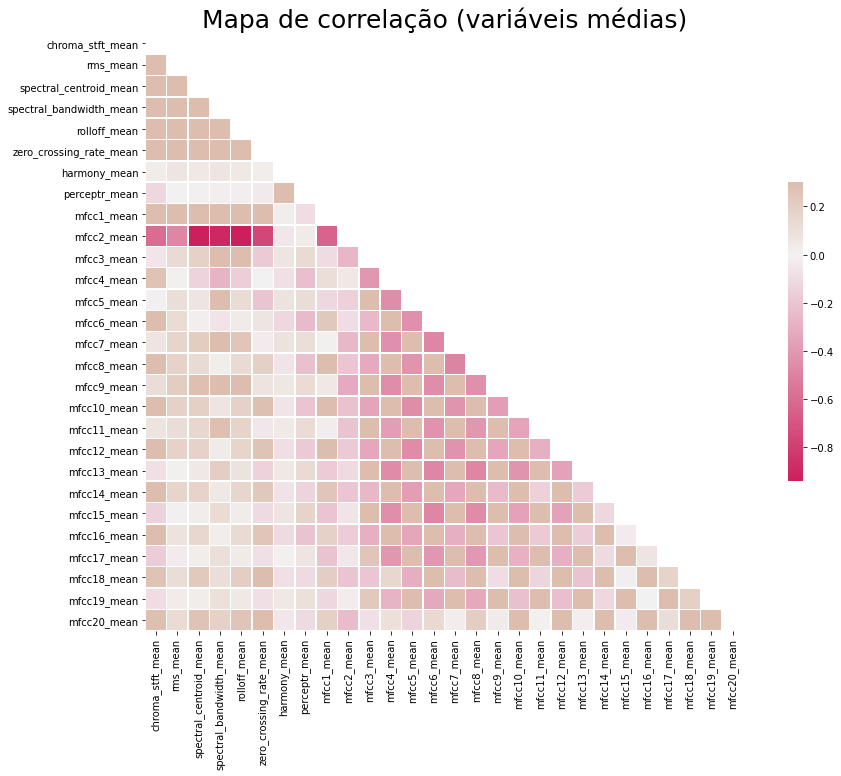

In [21]:
# Computando a matriz de correlação
spike_cols = [col for col in data.columns if 'mean' in col]
corr = data[spike_cols].corr()

# Gera o filtro para o triângulo de cima
mask = np.triu(np.ones_like(corr, dtype=np.bool))

# Ajustando a figura
f, ax = plt.subplots(figsize=(16,11))

# Gera um mapa de cores diversas
cmap = sns.diverging_palette(0, 25, as_cmap=True, s=90, l=45, n=5)

# Desenha um mapa de cores
sns.heatmap(corr, mask=mask, cmap=cmap, vmax=.3, center=0,
           square=True, linewidths=.5, cbar_kws={'shrink':0.5})

plt.title('Mapa de correlação (variáveis médias)', fontsize=25)
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)
plt.savefig("Mapa de correlação.jpg")

#### Boxplot para distribuição dos gêneros

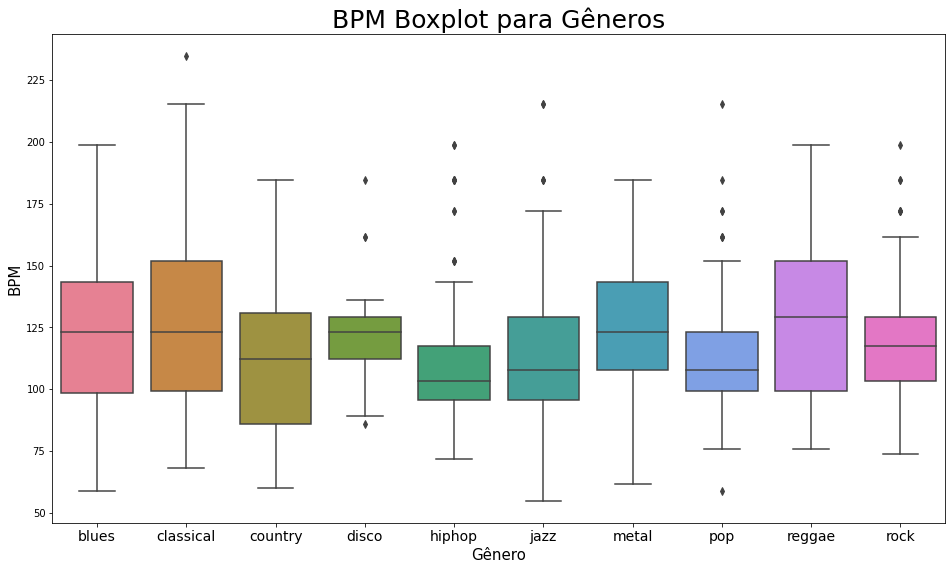

In [22]:
x = data[['label', 'tempo']]

f, ax = plt.subplots(figsize=(16,9))
sns.boxplot(x='label', y='tempo', data=x, palette='husl')

plt.title('BPM Boxplot para Gêneros', fontsize=25)
plt.xticks(fontsize=14)
plt.yticks(fontsize=10)
plt.xlabel('Gênero', fontsize=15)
plt.ylabel('BPM', fontsize=15)
plt.savefig('BPM Boxplot.jpg')

#### Componentes de Análise

1. Normalização
2. PCA
3. Scatterplot

In [23]:
from sklearn import preprocessing

data = data.iloc[0:, 1:]
y = data['label']
X = data.loc[:, data.columns != 'label']

# Normalizando X
cols = X.columns
min_max_scaler = preprocessing.MinMaxScaler()
np_scaled = min_max_scaler.fit_transform(X)
X = pd.DataFrame(np_scaled, columns = cols)

# 2 Componentes do PCA
from sklearn.decomposition import PCA

pca = PCA(n_components = 2)
principalComponents = pca.fit_transform(X)
principalDf = pd.DataFrame(data=principalComponents, columns=['principal component 1', 'principal component 2'])

# Concatena com o alvo
finalDf = pd.concat([principalDf, y], axis=1)

print("Variância explicada:",round(sum(pca.explained_variance_ratio_)*100, 2),"%")

Variância explicada: 46.18 %


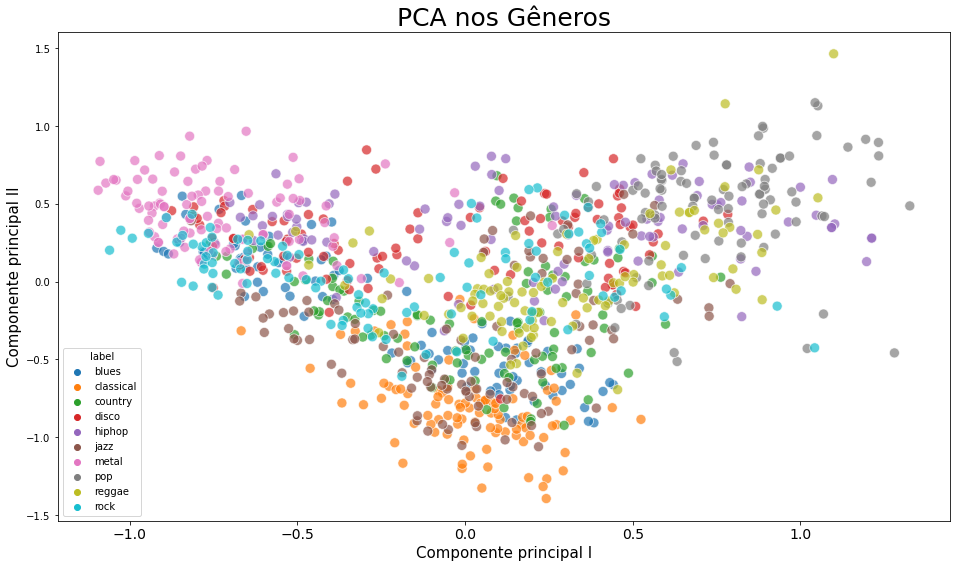

In [42]:
plt.figure(figsize = (16,9))
sns.scatterplot(x='principal component 1', y='principal component 2',
               data=finalDf, hue='label', alpha = 0.7, s=100)

plt.title('PCA nos Gêneros', fontsize = 25)
plt.xticks(fontsize=14)
plt.yticks(fontsize=10)
plt.xlabel('Componente principal I', fontsize = 15)
plt.ylabel('Componente principal II', fontsize = 15)
plt.savefig('Scatterplot PCA.jpg')

## Classificação com Machine Learning

Usando o `features_3_sec.csv`, podemos construir um classificador que prediz com precisão 

In [25]:
# Importando as bibliotecas
from sklearn.naive_bayes import GaussianNB
from sklearn.linear_model import SGDClassifier, LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.neural_network import MLPClassifier
from xgboost import XGBClassifier, XGBRFClassifier
from xgboost import plot_tree, plot_importance

from sklearn.metrics import confusion_matrix, accuracy_score, roc_auc_score, roc_curve
from sklearn import preprocessing
from sklearn.model_selection import train_test_split
from sklearn.feature_selection import RFE

## Variáveis features e target

- cria as variáveis necessárias
- normaliza os dados

In [26]:
y = data['label']
X = data.loc[:, data.columns != 'label']

# Normalizando
cols = X.columns
min_max_scaler = preprocessing.MinMaxScaler()
np_scaled = min_max_scaler.fit_transform(X)

# Novo df com dados escalados
X = pd.DataFrame(np_scaled, columns = cols)

In [27]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3,
                                                   random_state=42)

## Criando uma função para acurácia do modelo

In [28]:
def model_assess(model, title='Default'):
    model.fit(X_train, y_train)
    preds = model.predict(X_test)
    print('Acurácia', title, ':', round(accuracy_score(y_test, preds), 5), '\n')

## Testando diferentes modelos

In [29]:
# Naive Bayes
nb = GaussianNB()
model_assess(nb, "Naive Bayes")

# Stochastic Gradient Descent
sgd = SGDClassifier(max_iter=5000, random_state=0)
model_assess(sgd, "Stochastic Gradient Descent")

# KNN
knn = KNeighborsClassifier(n_neighbors=19)
model_assess(knn, "KNN")

# Decission trees
tree = DecisionTreeClassifier()
model_assess(tree, "Decission trees")

# Random Forest
rforest = RandomForestClassifier(n_estimators=1000, max_depth=10, random_state=0)
model_assess(rforest, "Random Forest")

# Support Vector Machine
svm = SVC(decision_function_shape="ovo")
model_assess(svm, "Support Vector Machine")

# Logistic Regression
lg = LogisticRegression(random_state=0, solver='lbfgs', multi_class='multinomial')
model_assess(lg, "Logistic Regression")

# Neural Nets
nn = MLPClassifier(solver='lbfgs', alpha=1e-5, hidden_layer_sizes=(5000, 10), random_state=1)
model_assess(nn, "Neural Nets")

# Cross Gradient Booster
xgb = XGBClassifier(n_estimators=1000, learning_rate=0.05)
model_assess(xgb, "Cross Gradient Booster")

# Cross Gradient Booster (Random Forest)
xgbrf = XGBRFClassifier(objective= 'multi:softmax')
model_assess(xgbrf, "Cross Gradient Booster (Random Forest)")

Acurácia Naive Bayes : 0.49 

Acurácia Stochastic Gradient Descent : 0.62333 

Acurácia KNN : 0.58 

Acurácia Decission trees : 0.54333 

Acurácia Random Forest : 0.73667 

Acurácia Support Vector Machine : 0.64333 

Acurácia Logistic Regression : 0.62 

Acurácia Neural Nets : 0.61 

Acurácia Cross Gradient Booster : 0.73667 

Acurácia Cross Gradient Booster (Random Forest) : 0.66333 



Acurácia : 0.73667 



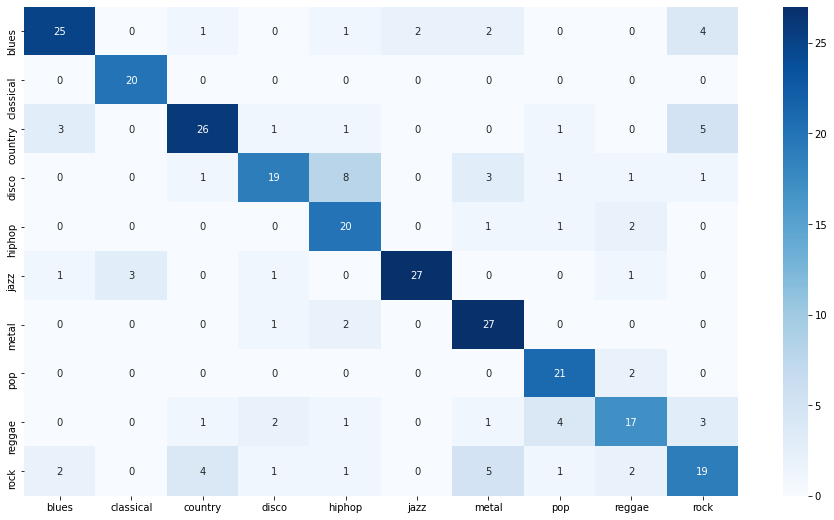

In [43]:
# Modelo final
xgb = XGBClassifier(n_estimators=1000, learning_rate=0.05)
xgb.fit(X_train, y_train)

preds = xgb.predict(X_test)

print('Acurácia',':', round(accuracy_score(y_test, preds), 5), '\n')

# Matriz de confusão
confusion_matr = confusion_matrix(y_test, preds)
plt.figure(figsize=(16,9))
sns.heatmap(confusion_matr, cmap="Blues", annot=True, 
            xticklabels = ["blues", "classical", "country", "disco", "hiphop", "jazz", "metal", "pop", "reggae", "rock"],
           yticklabels=["blues", "classical", "country", "disco", "hiphop", "jazz", "metal", "pop", "reggae", "rock"]);
plt.savefig("conf matrix")

In [31]:
import eli5
from eli5.sklearn import PermutationImportance

perm = PermutationImportance(estimator=xgb, random_state=1)
perm.fit(X_test, y_test)

eli5.show_weights(estimator=perm, feature_names = X_test.columns.tolist())

Weight,Feature
0.1480 ± 0.0241,length
0.0667 ± 0.0219,perceptr_var
0.0540 ± 0.0190,chroma_stft_mean
0.0260 ± 0.0195,perceptr_mean
0.0200 ± 0.0060,spectral_centroid_var
0.0193 ± 0.0204,rms_var
0.0180 ± 0.0108,chroma_stft_var
0.0173 ± 0.0171,mfcc4_mean
0.0173 ± 0.0129,mfcc13_var
0.0167 ± 0.0094,mfcc17_mean


## Sistemas de recomendação

Dado um vetor que encontra a melhor similaridade, ranqueia em ordem descendente da mais parecida para a menos

In [32]:
# Libraries
import IPython.display as ipd
from sklearn.metrics.pairwise import cosine_similarity
from sklearn import preprocessing

data = pd.read_csv(f'{general_path}/features_30_sec.csv', index_col='filename')

# Extrai os rótulos
labels = data[['label']]

# Dropa rótulos do dataframe original
data = data.drop(columns=['length','label'])
data.head()

# Escalando os dados
data_scaled=preprocessing.scale(data)
print('Tipo dos dados escalados:', type(data_scaled))

Tipo dos dados escalados: <class 'numpy.ndarray'>


## Similaridade de cosseno

In [33]:
# Similaridade
similarity = cosine_similarity(data_scaled)
print("Formato de similarity:", similarity.shape)

# Converte em dataframe
sim_df_labels = pd.DataFrame(similarity)
sim_df_names = sim_df_labels.set_index(labels.index)
sim_df_names.columns = labels.index

sim_df_names.head()

Formato de similarity: (1000, 1000)


filename,blues.00000.wav,blues.00001.wav,blues.00002.wav,blues.00003.wav,blues.00004.wav,blues.00005.wav,blues.00006.wav,blues.00007.wav,blues.00008.wav,blues.00009.wav,...,rock.00090.wav,rock.00091.wav,rock.00092.wav,rock.00093.wav,rock.00094.wav,rock.00095.wav,rock.00096.wav,rock.00097.wav,rock.00098.wav,rock.00099.wav
filename,,,,,,,,,,,,,,,,,,,,,
blues.00000.wav,1.000000,0.049231,0.589618,0.284862,0.025561,-0.346688,-0.219483,-0.167626,0.641877,-0.097889,...,-0.082829,0.546169,0.578558,0.662590,0.571629,0.610942,0.640835,0.496294,0.284958,0.304098
blues.00001.wav,0.049231,1.000000,-0.096834,0.520903,0.080749,0.307856,0.318286,0.415258,0.120649,0.404168,...,-0.098111,-0.325126,-0.370792,-0.191698,-0.330834,-0.077301,-0.222119,-0.302573,0.499562,0.311723
blues.00002.wav,0.589618,-0.096834,1.000000,0.210411,0.400266,-0.082019,-0.028061,0.104446,0.468113,-0.132532,...,-0.032408,0.561074,0.590779,0.583293,0.514537,0.495707,0.566837,0.589983,0.216378,0.321069
blues.00003.wav,0.284862,0.520903,0.210411,1.000000,0.126437,0.134796,0.300746,0.324566,0.352758,0.295184,...,-0.320107,-0.206516,-0.151132,0.041986,-0.172515,-0.000287,0.020515,-0.107821,0.502279,0.183210
blues.00004.wav,0.025561,0.080749,0.400266,0.126437,1.000000,0.556066,0.482195,0.623455,0.029703,0.471657,...,0.087605,0.017366,0.138035,0.104684,-0.034594,0.063454,0.063546,0.172944,0.153192,0.061785


## Similaridade sonora

In [34]:
def find_similar_songs(name):
    series = sim_df_names[name].sort_values(ascending=False)
    
    series = series.drop(name)
    
    print("\n*******\n Sons similares ao ", name)
    print(series.head(5))

In [35]:
# metal.00002 - Iron Maiden "Flight of Icarus"
find_similar_songs('metal.00002.wav')

ipd.Audio(f'{general_path}/genres_original/metal/metal.00002.wav')


*******
 Sons similares ao  metal.00002.wav
filename
metal.00028.wav    0.904367
metal.00059.wav    0.896096
rock.00018.wav     0.891910
rock.00017.wav     0.886526
rock.00016.wav     0.867508
Name: metal.00002.wav, dtype: float64


In [36]:
# Match 01
# Motorhead - Ace of Spades
ipd.Audio(f'{general_path}/genres_original/metal/metal.00028.wav')

In [37]:
# Match 02
# Queen - Tear it Up
ipd.Audio(f'{general_path}/genres_original/metal/metal.00059.wav')

In [38]:
# Match 03
# Queen - Another One Bites the Dust
ipd.Audio(f'{general_path}/genres_original/rock/rock.00018.wav')

In [39]:
# Match 04
# Queen - Under Pressure
ipd.Audio(f'{general_path}/genres_original/rock/rock.00017.wav')

In [40]:
# Match 05
# Queen - Tie Your Mother Down
ipd.Audio(f'{general_path}/genres_original/rock/rock.00016.wav')